In [32]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px
# from plotly.offline import init_notebook_mode, iplot
# init_notebook_mode(connected=True)

In [33]:
url = 'https://raw.githubusercontent.com/fulekset/voila-dashboard/63fc9dfbb098b85c6347e5c433905d6100ed899a/DATA_IRWS.xlsx'
df_uprava=pd.read_excel(url, engine="openpyxl")
df_uprava['DMC'] = df_uprava['DMC'].astype(str)

In [34]:
# df_piv = pd.pivot_table(df_uprava, values = 'Value', index =['DMC'], columns = 'Parameter_Machine_AP').reset_index().drop(columns="DMC")
# #df_piv1=df_piv.reset_index()
# df_piv.head(2)

In [35]:
# cov = df_piv.cov().reset_index()

In [36]:
# melted_df = pd.melt(cov, id_vars=['Parameter_Machine_AP'], var_name='param', value_name='value')
# melted_df

In [37]:
# melted_df.to_excel("covariacia.xlsx")

In [38]:
# au_corr.info()

In [39]:
# px.imshow(cov.round(3),text_auto=True,aspect='auto')

In [40]:
# df_uprava["Parameter_Machine_AP"].unique()

In [41]:
# df_uprava.info()

#### SCATTER CHART

In [42]:
parameter_list_uprava=df_uprava.Parameter_Machine_AP.unique() #list parametrov

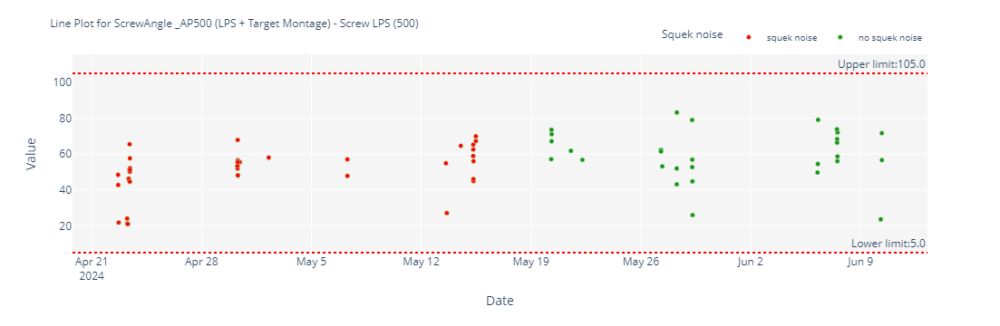

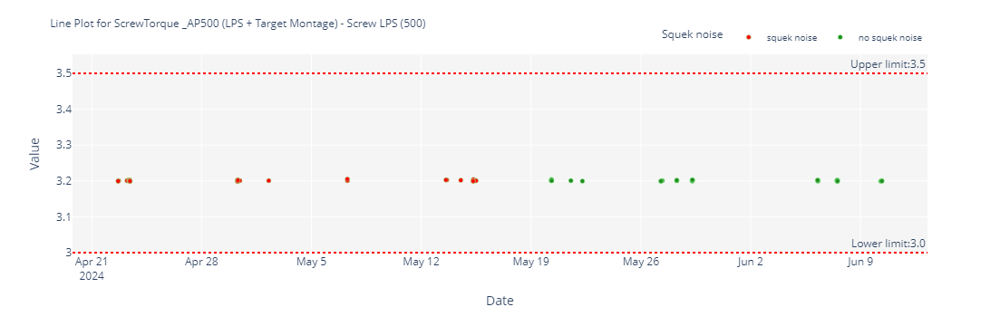

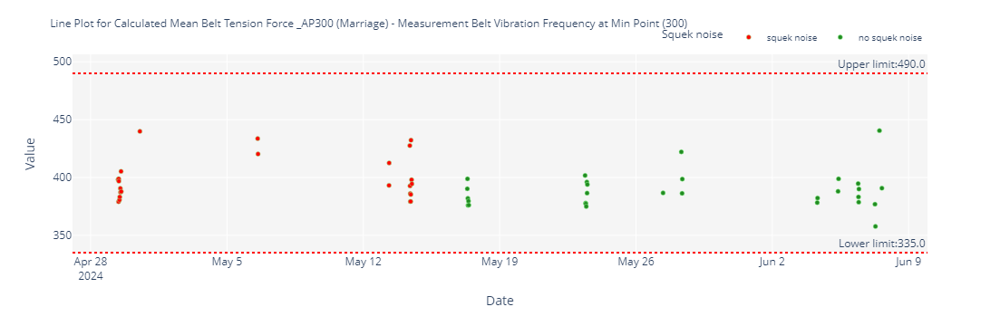

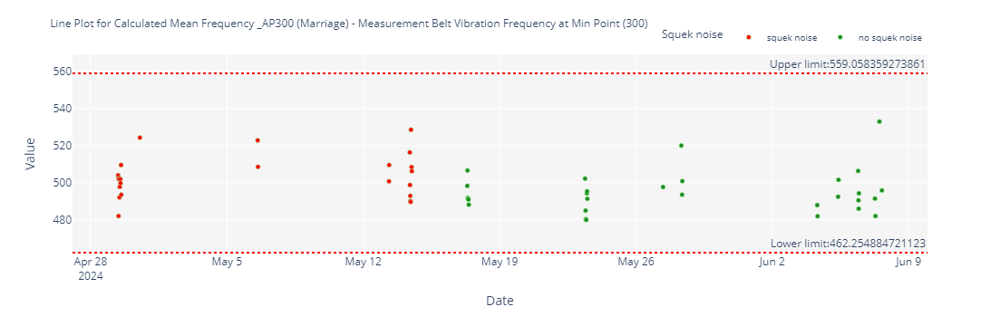

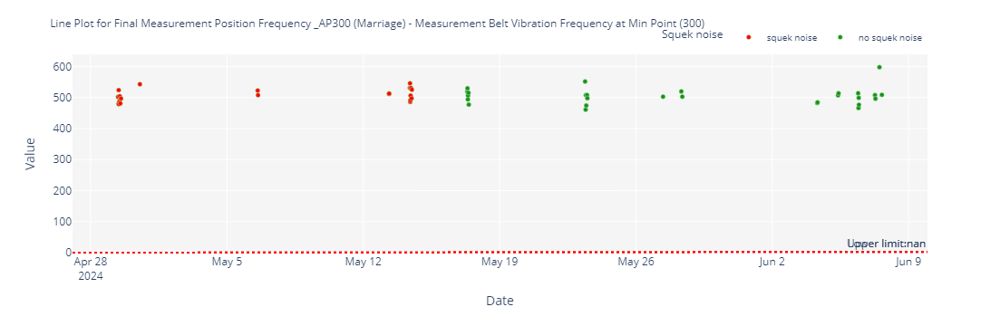

...

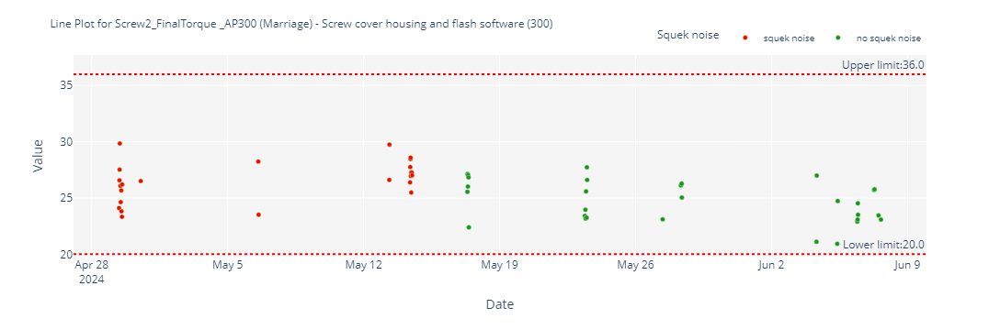

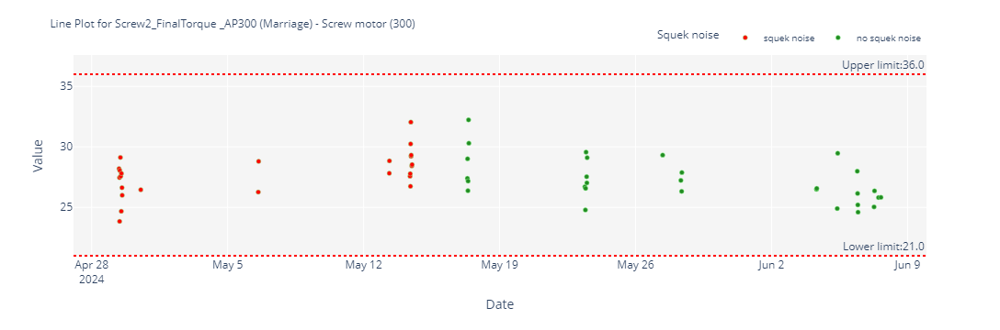

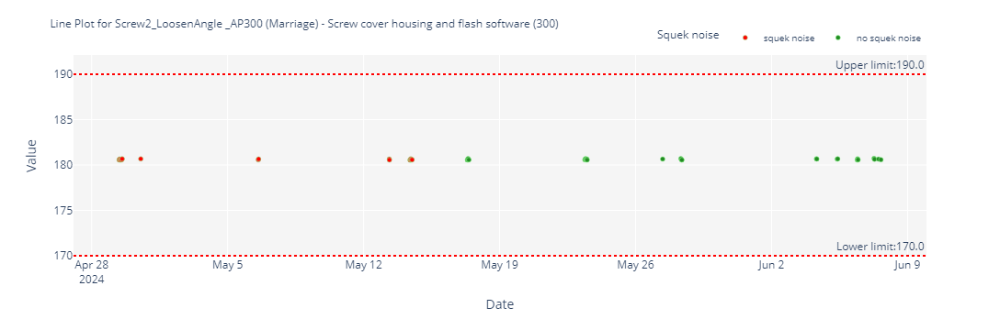

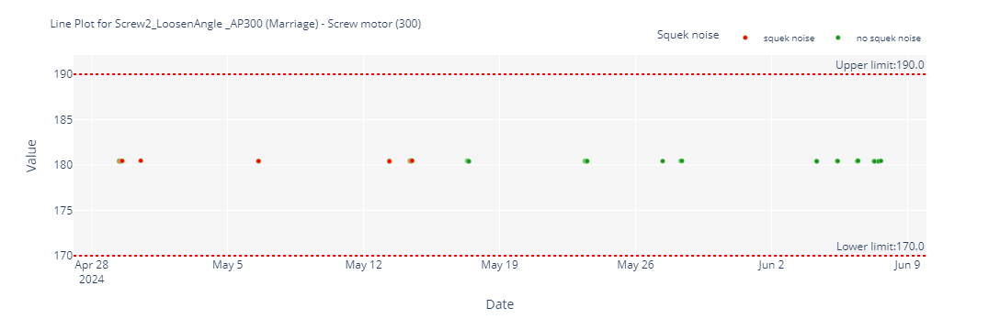

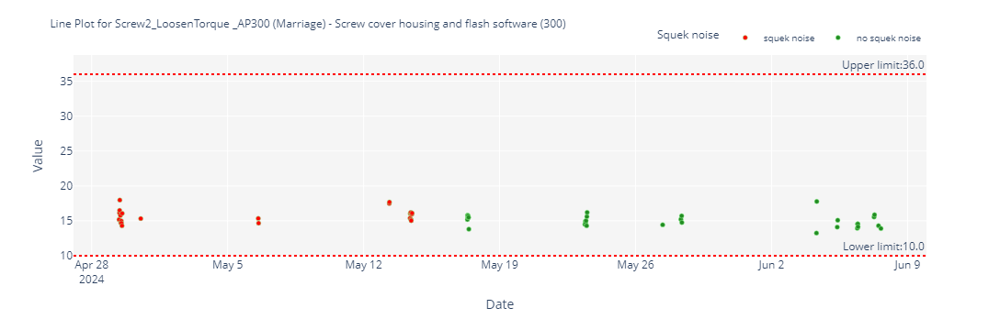

In [43]:
for param in parameter_list_uprava:
    UL=df_uprava[df_uprava['Parameter_Machine_AP']==param]['Upper limit'].iloc[0] #horná tolerancia
    LL=df_uprava[df_uprava['Parameter_Machine_AP']==param]['Lower limit'].iloc[0] #dolná tolerancia
    fig=px.scatter(df_uprava[df_uprava['Parameter_Machine_AP']==param],x='Date',y='Value',color='Squek noise', #typ grafu
    color_discrete_map={'no squek noise':"forestgreen","squek noise":"red"})#color_continuous_scale=px.colors.sequential.Rainbow)
    fig.add_hline(y=UL, line_dash="dot", line_color="red", annotation_text=f'Upper limit:{UL}') #pridanie tolerancie do grafu
    fig.add_hline(y=LL, line_dash="dot", line_color="red", annotation_text=f'Lower limit:{LL}') #pridanie tolerancie do grafu
    fig.update_layout(legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1), legend_font_size=10) #nastavenie legendy
    fig.update_layout(title=f"Line Plot for {param}", title_font_size=12) #nastavenie nadpisu
    fig.update_layout(plot_bgcolor='whitesmoke') #nastavenie pozadia grafu
    fig.update_traces(marker=dict(size=5,line=dict(width=0.5,color='palegreen')),selector=dict(mode='markers')) #nastavenie bodov v grafe
    fig.show() #ukážka grafu

#### BOX PLOT

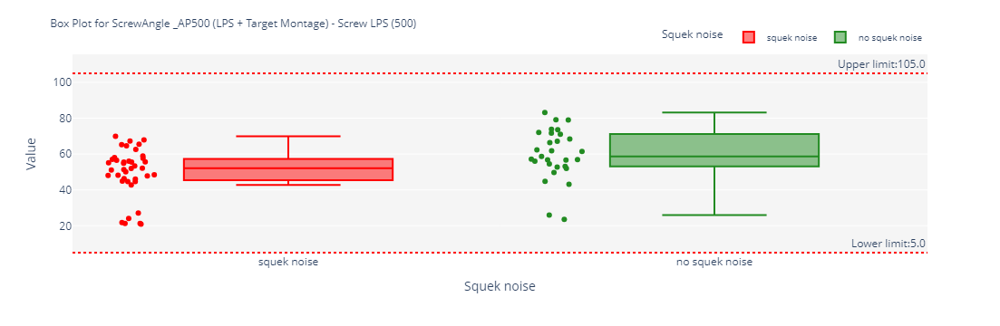

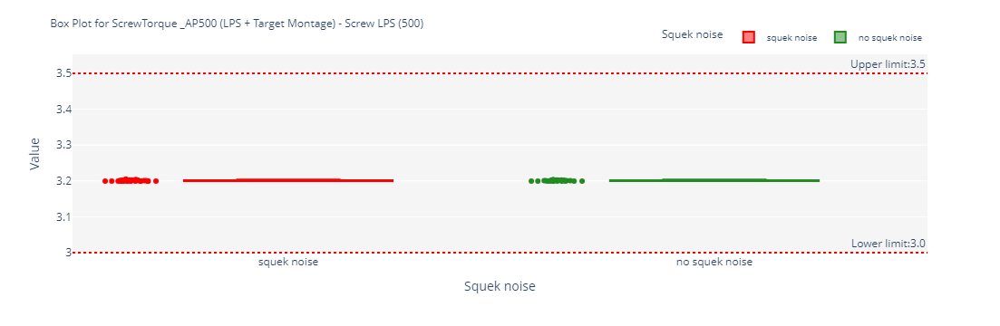

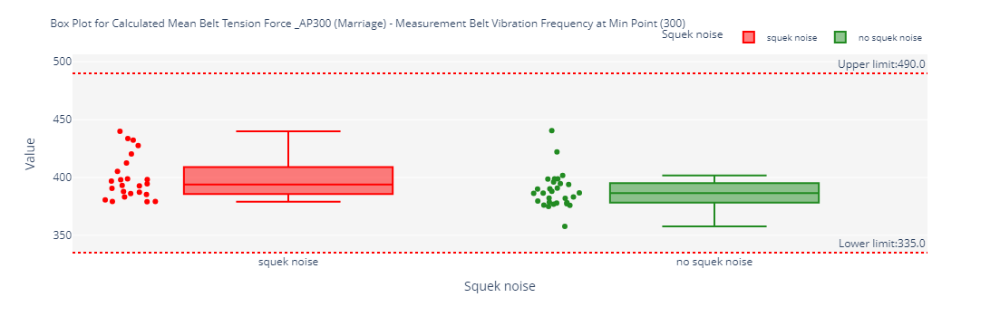

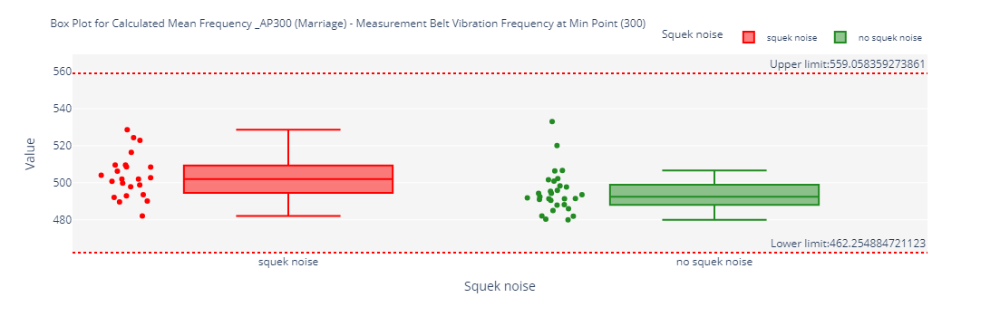

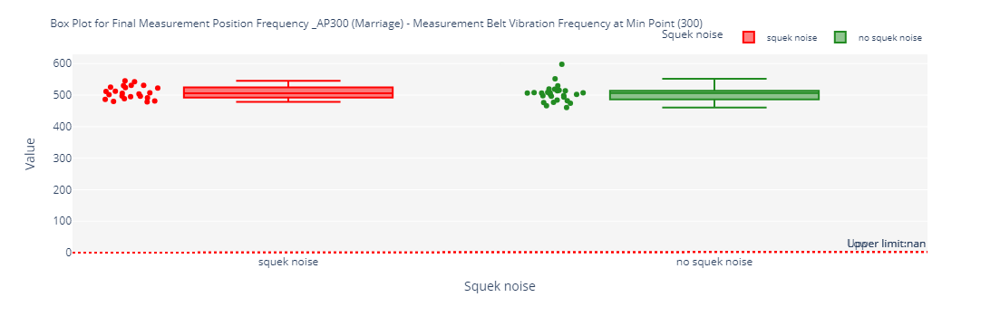

...

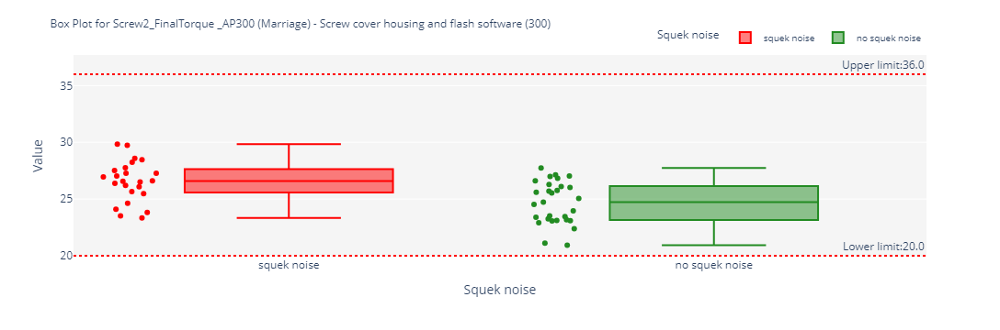

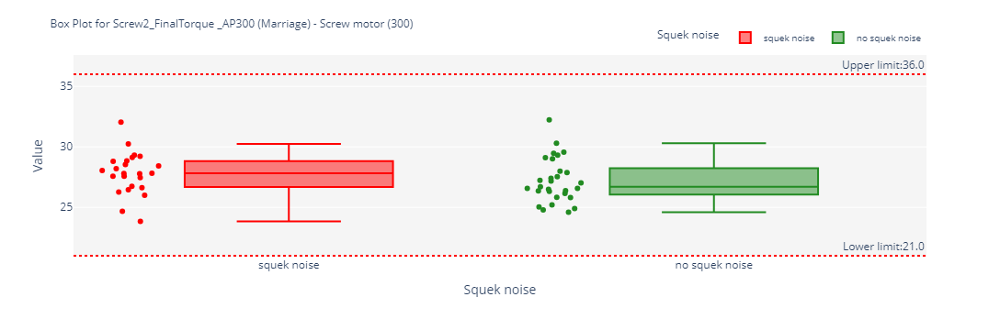

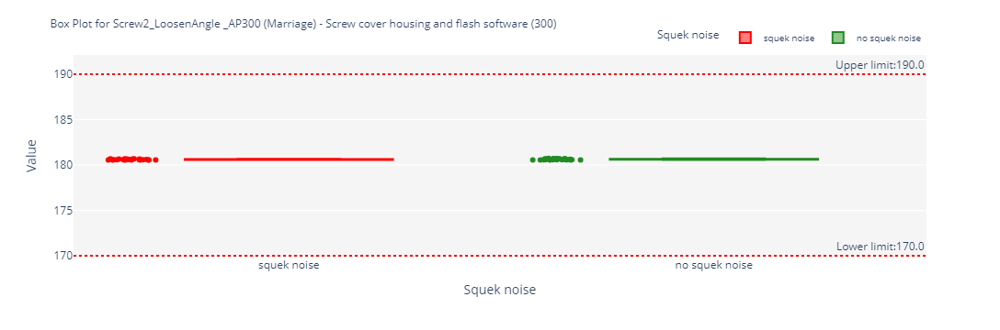

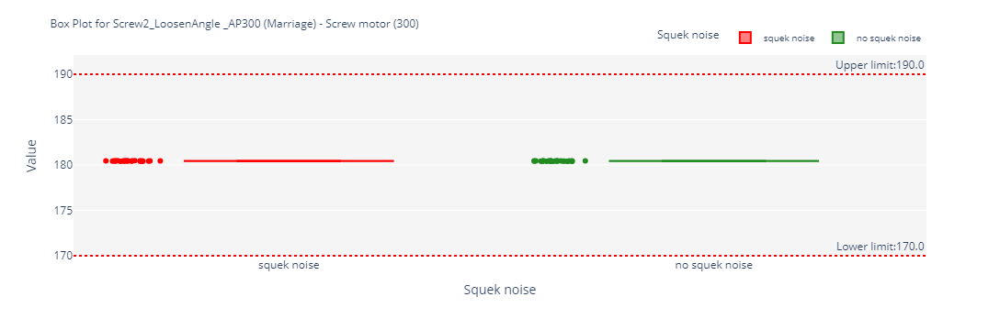

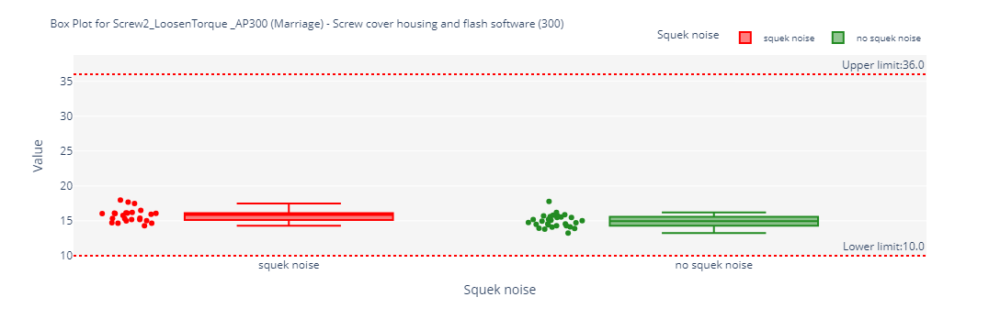

In [ ]:
for param in parameter_list_uprava:
    UL=df_uprava[df_uprava['Parameter_Machine_AP']==param]['Upper limit'].iloc[0] #horná tolerancia
    LL=df_uprava[df_uprava['Parameter_Machine_AP']==param]['Lower limit'].iloc[0] #dolná tolerancia
    fig = px.box(df_uprava[df_uprava['Parameter_Machine_AP']==param], x="Squek noise", y="Value", points="all", color="Squek noise",
                 color_discrete_map={'no squek noise':"forestgreen","squek noise":"red"})
    fig.add_hline(y=UL, line_dash="dot", line_color="red", annotation_text=f'Upper limit:{UL}') #pridanie tolerancie do grafu
    fig.add_hline(y=LL, line_dash="dot", line_color="red", annotation_text=f'Lower limit:{LL}') #pridanie tolerancie do grafu
    fig.update_layout(legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1), legend_font_size=10) #nastavenie legendy
    fig.update_layout(title=f"Box Plot for {param}", title_font_size=12) #nastavenie nadpisu
    fig.update_layout(plot_bgcolor='whitesmoke') #nastavenie pozadia grafu
    fig.update_traces(marker=dict(size=5,line=dict(width=0.5,color='palegreen')),selector=dict(mode='markers')) #nastavenie bodov v grafe
    fig.show() #ukážka grafu

In [27]:
# help(px.box)

In [28]:
# help(go.Figure)